In [1]:
import pandas as pd
import networkx as nx
from itertools import combinations
from scipy.stats import kendalltau
import numpy as np
import pickle as pkl
from multiprocessing import Pool

from tqdm import tqdm
import matplotlib.pyplot as plt

In [2]:
df = pd.read_csv("/shared/norm_count.csv", index_col = 0)
# Multiindex columns to be (cellline, gene, shRNA, replicate)
df.columns=pd.MultiIndex.from_tuples([tuple(x.split()[-4:]) for x in df.columns])
genes = sorted(set(x[1] for x in df.columns))
genes.remove("CTRL")
systems = sorted(set(x[1] for x in df.columns))
networks = {x: None for x in systems}
corr = {x: None for x in systems}
for g in systems:
    data = df.xs(g, axis=1, level=1, drop_level=False).loc[genes]
    kendall = pd.DataFrame(0, columns=genes, index=genes)
    for i, j in combinations(genes, 2):
        kendall.loc[i,j] = kendalltau(data.loc[i], data.loc[j])[0]
    kendall += kendall.T
    np.fill_diagonal(kendall.values, 1.0)
    corr[g] = kendall
pkl.dump(corr, open("/shared/tony/corr_coeff_20_kendall.pkl", "wb"))
change = []
for i, j in combinations(systems, 2):
    data = abs(corr[i] - corr[j])
    change += [((i, j), (genes[x[0]], genes[x[1]], data.loc[genes[x[0]], genes[x[1]]], corr[i].loc[genes[x[0]], genes[x[1]]], corr[j].loc[genes[x[0]], genes[x[1]]])) for x in np.argwhere(np.triu(data.values) > 0.5)]
len(change)
s = sorted(change, key=lambda x: x[1][2], reverse=True)
pkl.dump(s, open("/shared/tony/change_20_kendall.pkl", "wb"))
with open("/shared/tony/change_20_kendall.csv", "w") as f:
    f.write("sys1,sys2,gene1,gene2,corr_change,sys1_corr,sys2_corr\n")
    for i in s:
        f.write(",".join([str(y) for x in i for y in x]) + "\n")

In [3]:
def normalise(p, n):
    p = np.array(p)
    n = np.array(n)
    small = min(min(p), min(abs(n)))
    large = max(max(p), max(abs(n)))
    p = (p - small) / large
    n = (n + small) / large
    return p, n

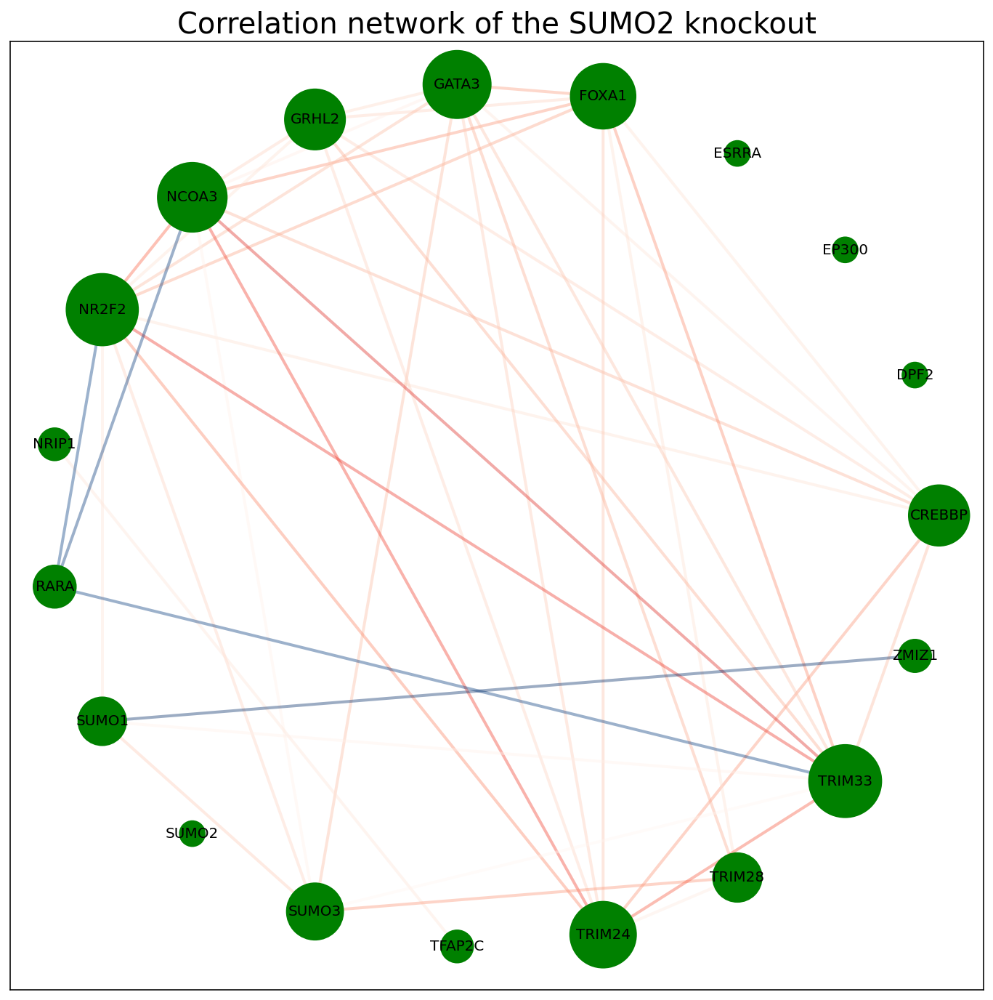

In [4]:
def corr_to_g(df, knockout, cut=0, norm=False):
    G = nx.Graph()
    pcolors = []
    ncolors = []
    positive = []
    negative = []
    node_colours = np.array(abs(df[abs(df) > cut]).sum()) * 300
    for x, y in np.argwhere(abs(np.triu(df.values)) > cut):
        if df.loc[genes[x], genes[y]] > 0:
            G.add_edge(genes[x], genes[y], weight=df.loc[genes[x], genes[y]])
            pcolors.append(df.loc[genes[x], genes[y]])
            positive.append((genes[x], genes[y]))
        elif df.loc[genes[x], genes[y]] < 0:
            G.add_edge(genes[x], genes[y], weight=abs(df.loc[genes[x], genes[y]]))
            ncolors.append(abs(df.loc[genes[x], genes[y]]))
            negative.append((genes[x], genes[y]))
    fig = plt.figure(figsize=(12, 12))
    pos = nx.circular_layout(genes)
    if norm:
        pcolors, ncolors = normalise(pcolors, ncolors)
    nx.draw_networkx_nodes(G, pos, alpha=1.0, node_size=node_colours, node_color="g", cmap=plt.cm.Greens, nodelist=genes)
    nx.draw_networkx_edges(G, pos, edge_color=pcolors, edgelist= positive, edge_cmap=plt.cm.Reds, edge_vmin=0.0, width=2.0, alpha=0.4, min_source_margin=25, min_target_margin=25)
    nx.draw_networkx_edges(G, pos, edge_color=ncolors, edgelist= negative, edge_cmap=plt.cm.Blues, edge_vmin=0.0, width=2.0, alpha=0.4, min_source_margin=25, min_target_margin=25)
    nx.draw_networkx_labels(G, pos, font_size=10)
    if knockout == "CTRL":
        plt.title("Correlation network of the control sample", fontsize=20)
    else:
        plt.title(f"Correlation network of the {knockout} knockout", fontsize=20)
    return fig
corr_to_g(corr["SUMO2"], "SUMO2", 0.6, True).show()

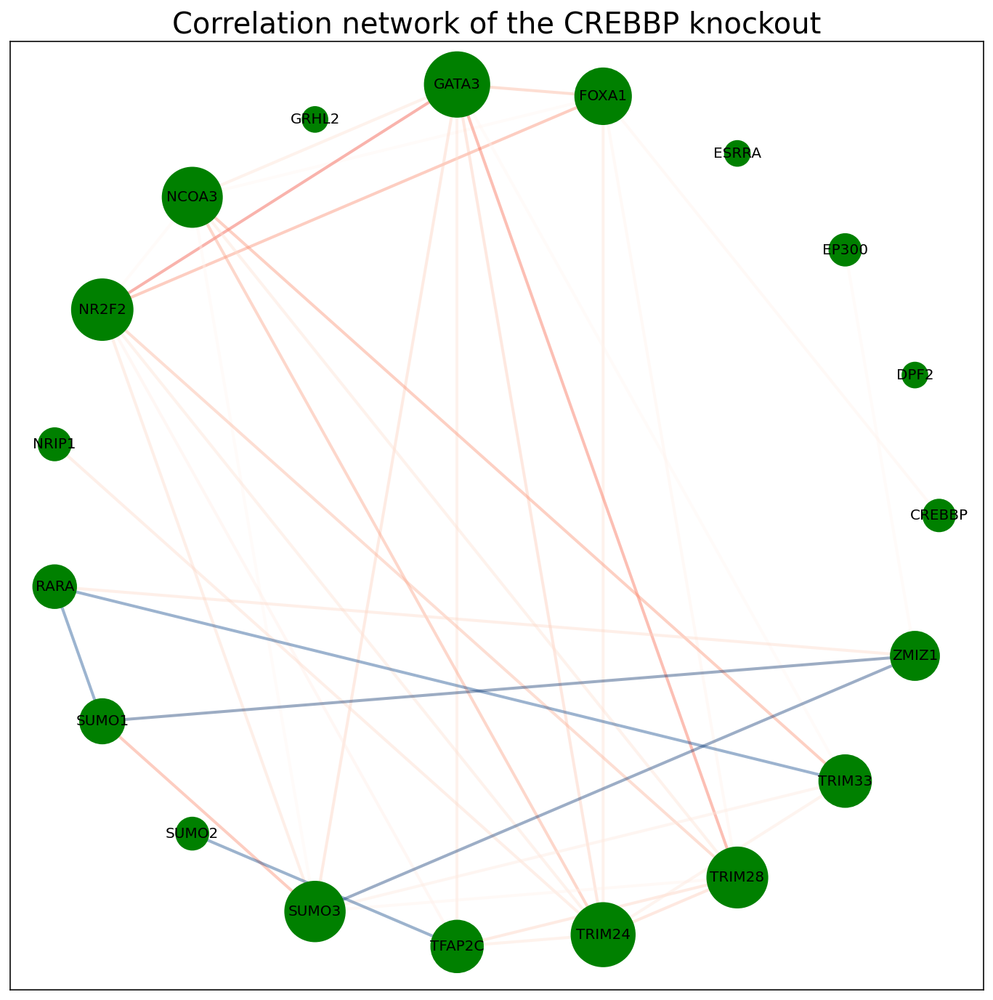

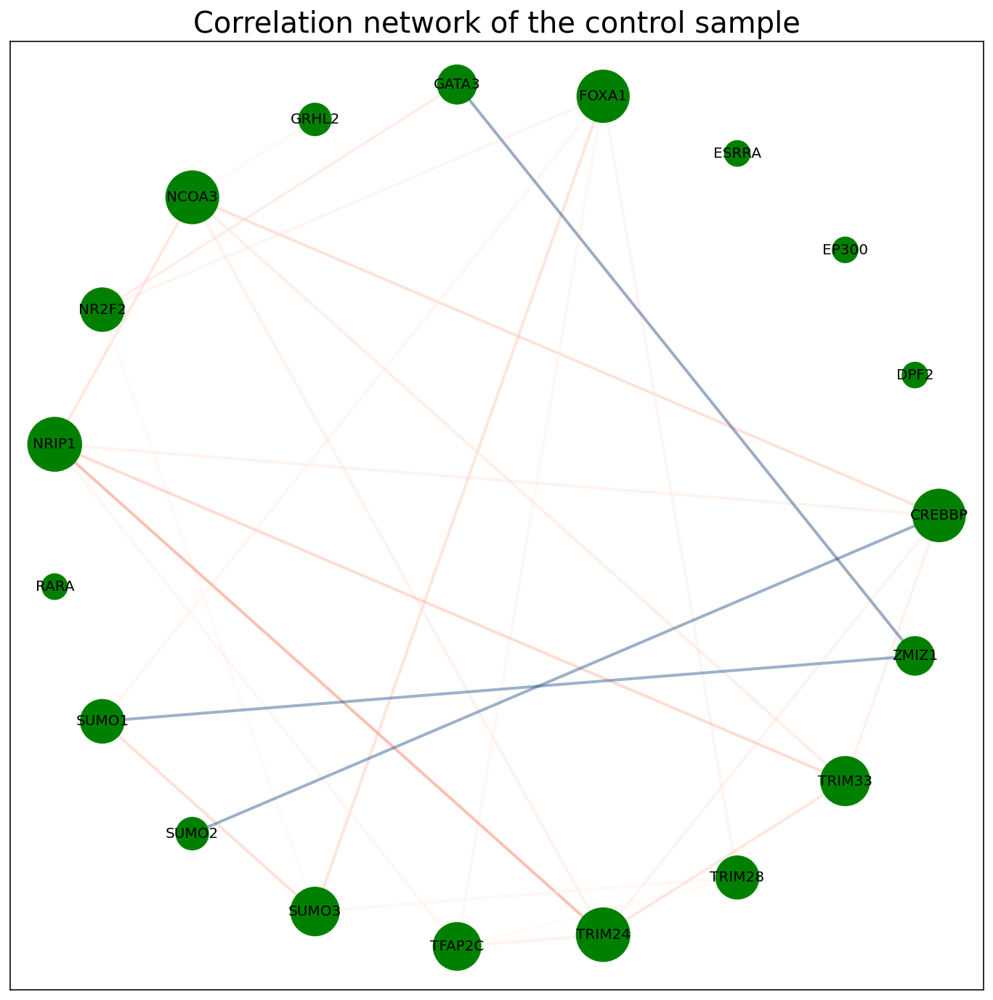

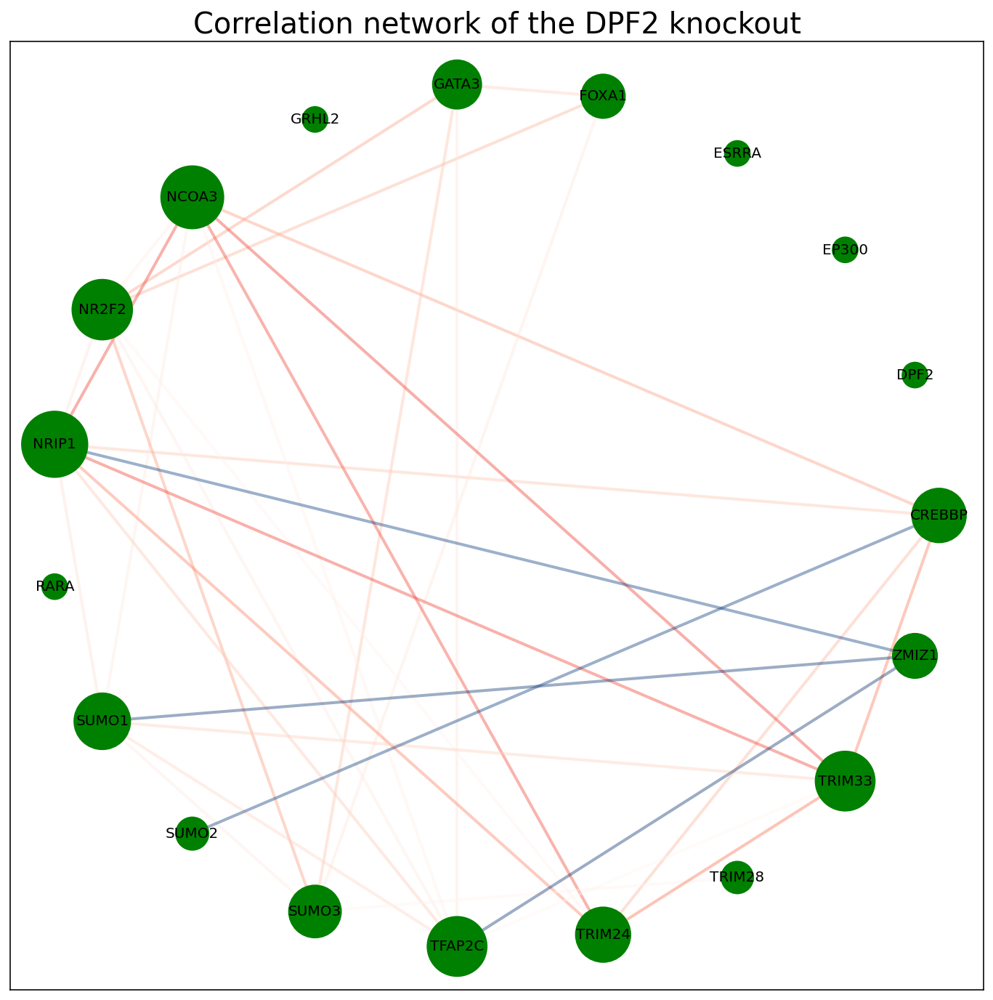

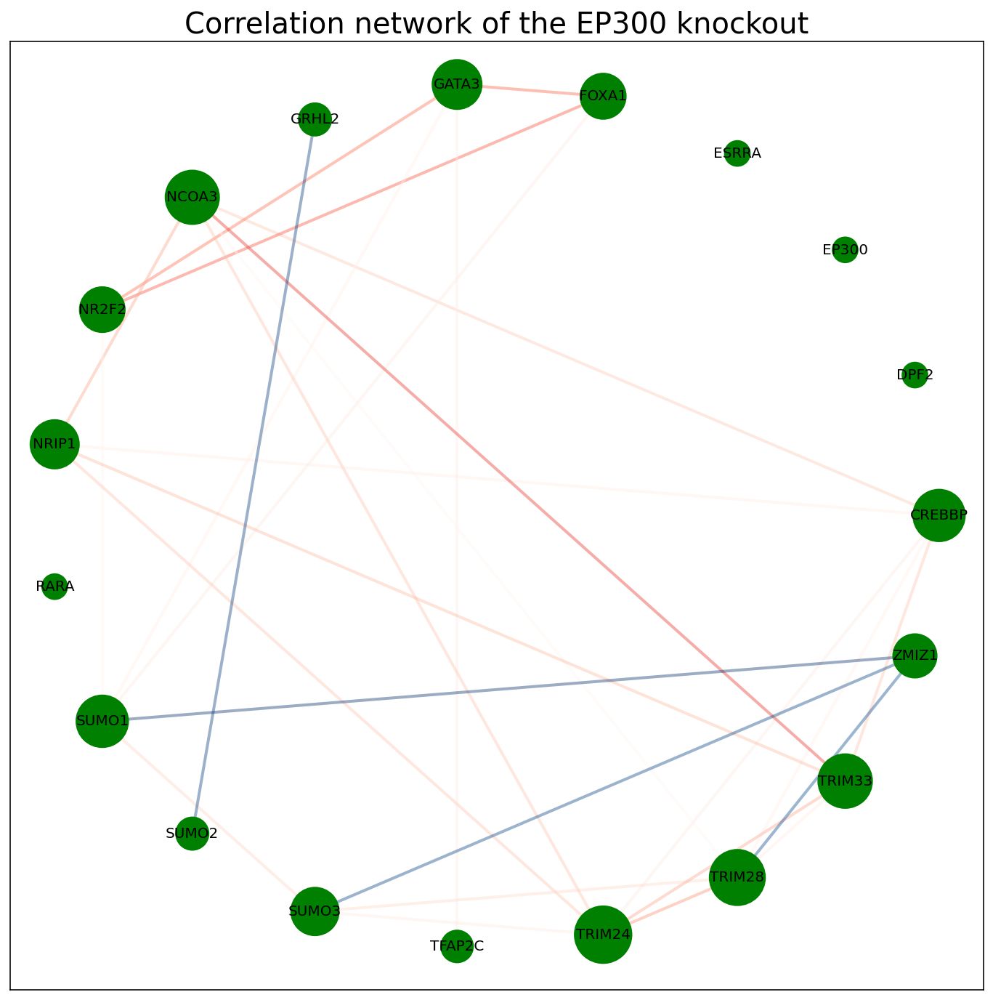

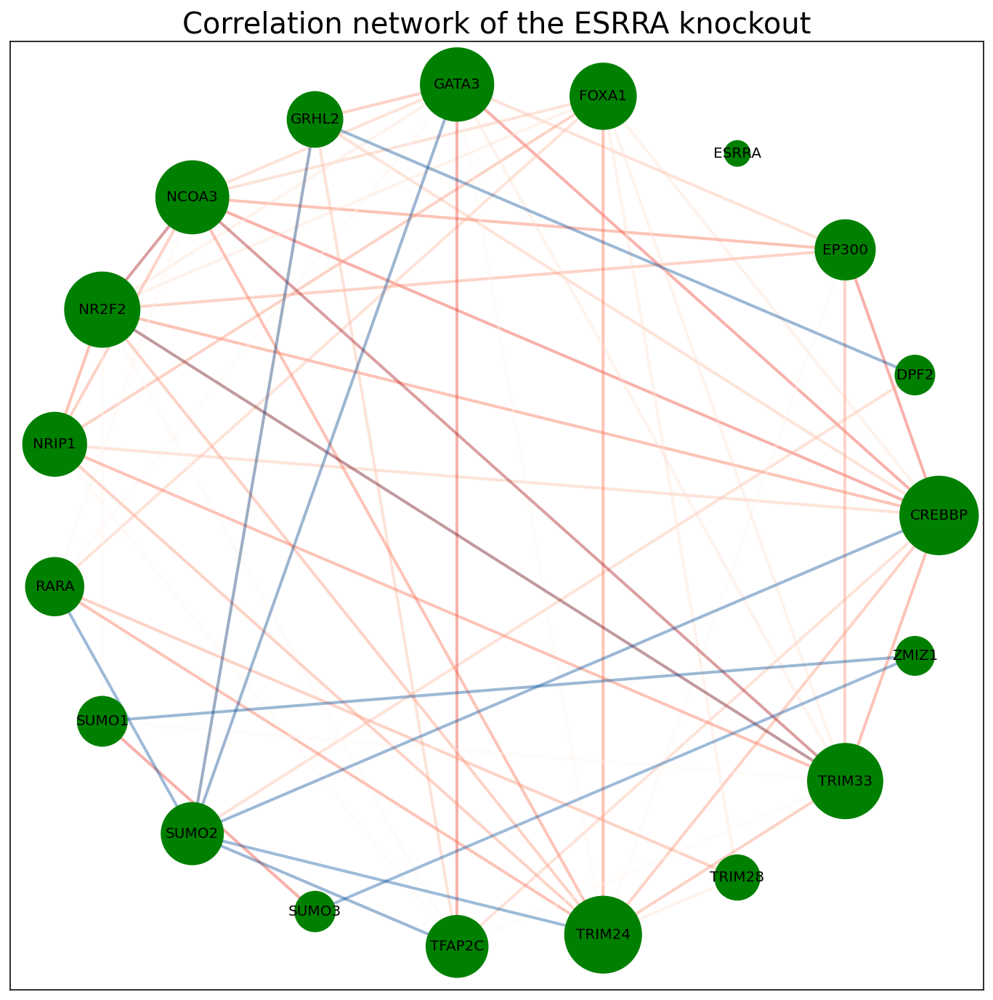

...

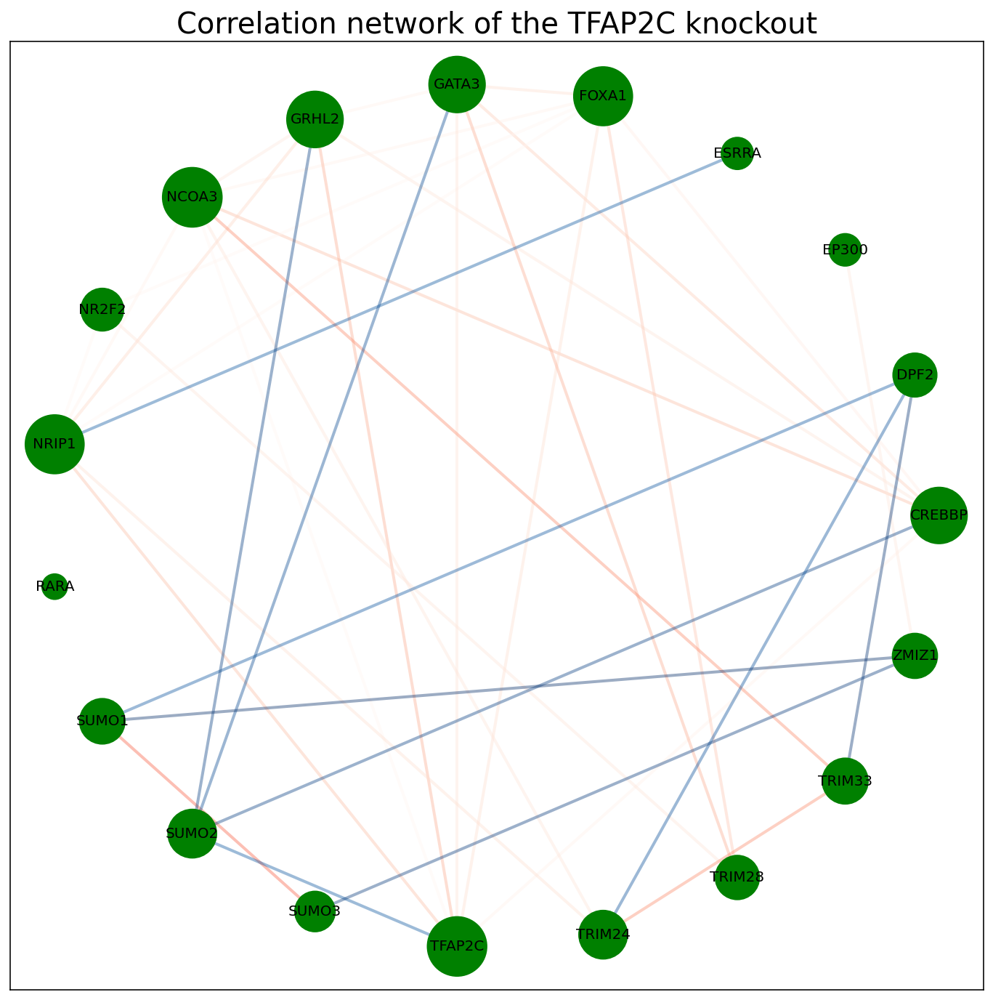

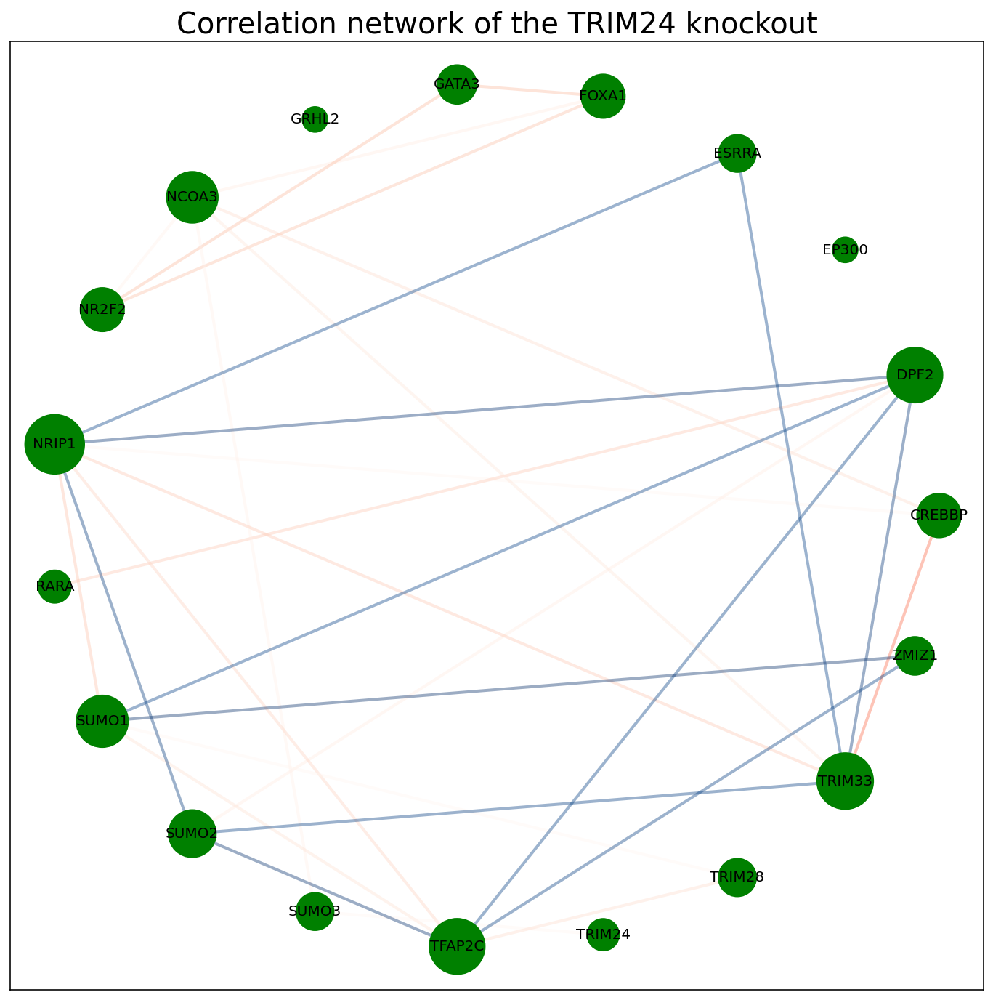

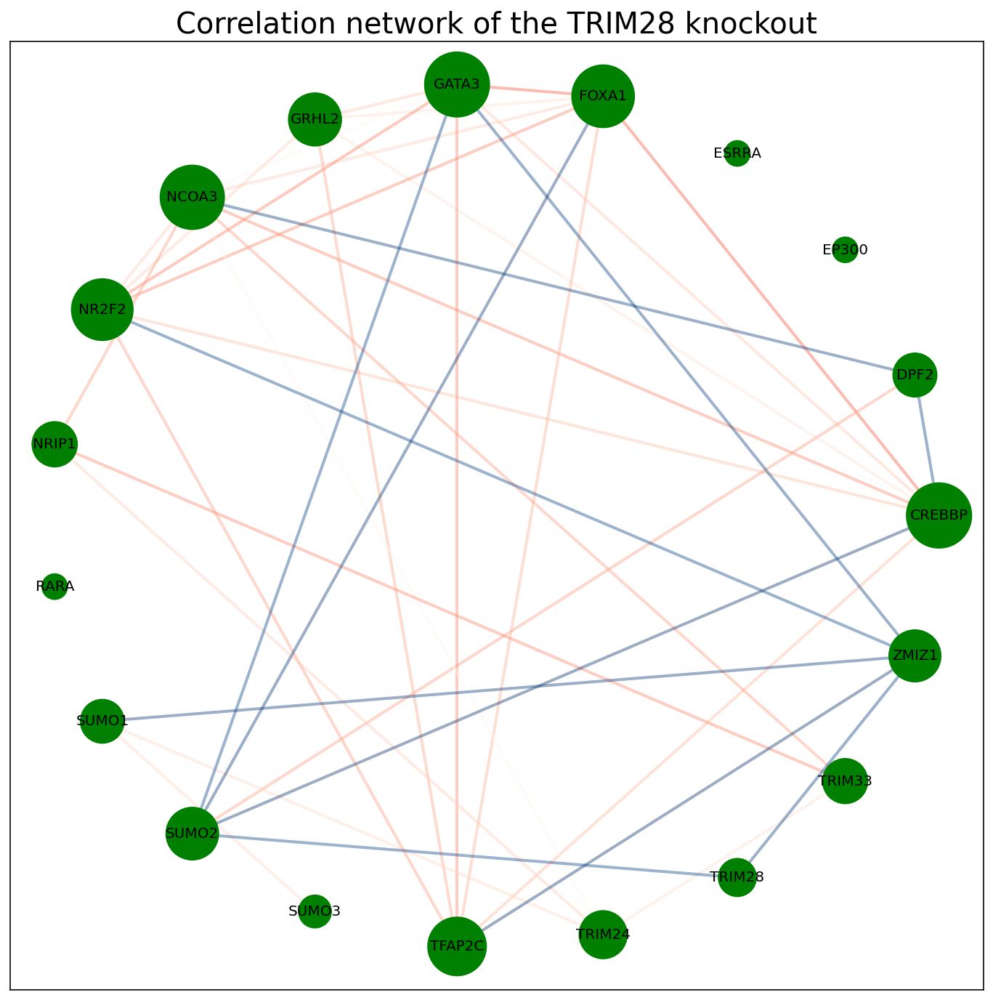

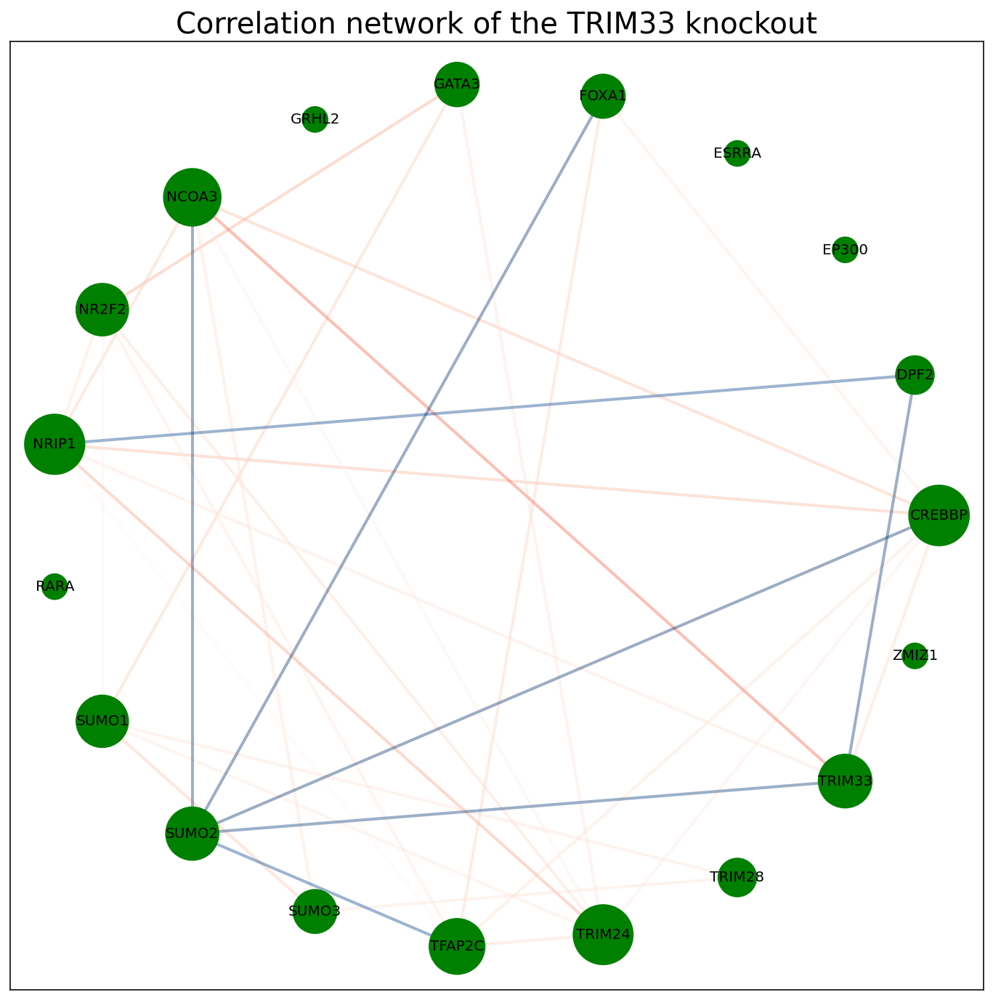

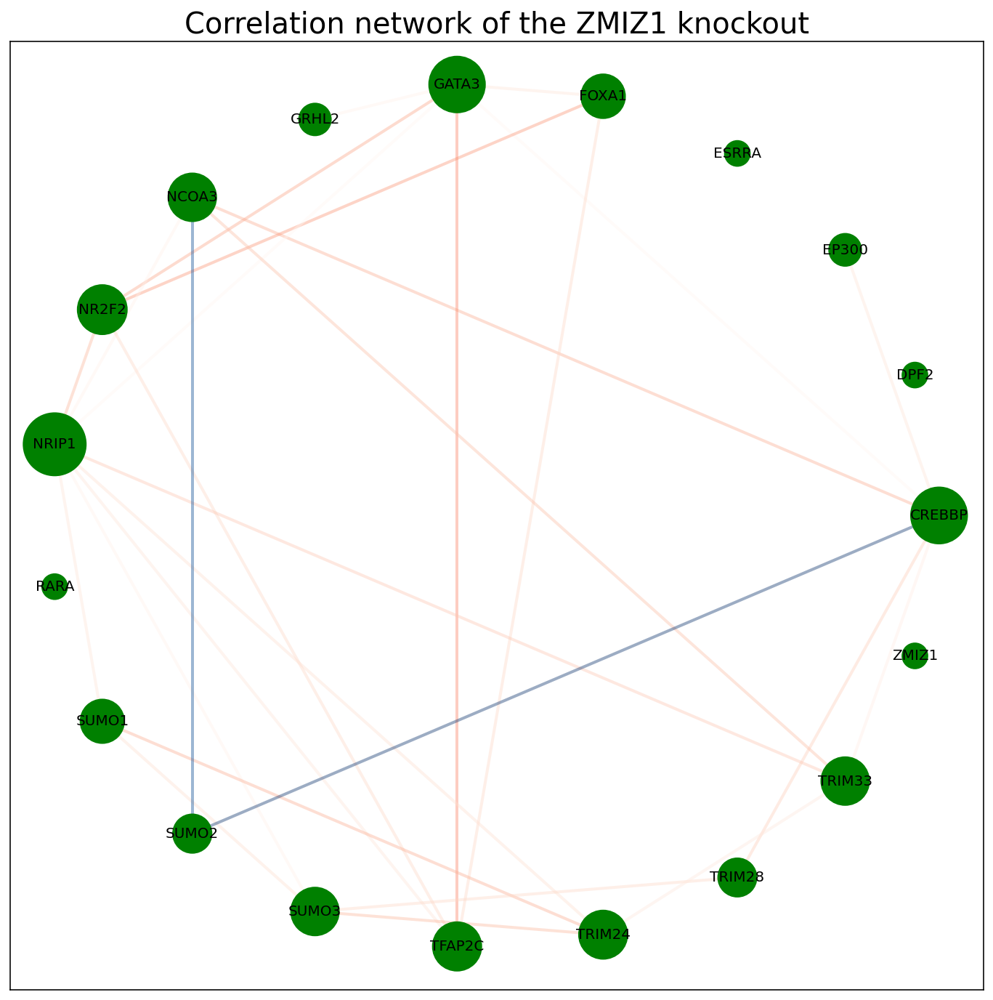

In [5]:
for i in systems:
    corr_to_g(corr[i], i, 0.6, True).savefig(f"/shared/tony/plots/kendall_correlation_network_{i}.png")

In [6]:
large_genes = []
for g in genes:
    data = pd.read_csv(f"/shared/DE_DESeq/CTRL_vs_{g}_results_DESeq.csv", index_col=0)
    large_genes += list(data[data.padj < 0.05].sort_values("padj").index[:100])

In [7]:
large_genes = sorted(set(large_genes))

In [8]:
def calc_kendall(data, gene_list):
    kendall = pd.DataFrame(0, columns=gene_list, index=gene_list)
    for i, j in tqdm(list(combinations(gene_list, 2))):
        kendall.loc[i,j] = kendalltau(data.loc[i], data.loc[j])[0]
    kendall += kendall.T
    np.fill_diagonal(kendall.values, 1.0)
    return kendall

In [29]:
df = pd.read_csv("/shared/norm_count.csv", index_col = 0)
# Multiindex columns to be (cellline, gene, shRNA, replicate)
df.columns=pd.MultiIndex.from_tuples([tuple(x.split()[-4:]) for x in df.columns])
systems = sorted(set(x[1] for x in df.columns))
networks = {x: None for x in systems}
corr = {x: None for x in systems}
for g in systems:
    data = df.xs(g, axis=1, level=1, drop_level=False).loc[large_genes]
    kendall = pd.DataFrame(0, columns=large_genes, index=large_genes)
    for i, j in combinations(large_genes, 2):
        kendall.loc[i,j] = kendalltau(data.loc[i], data.loc[j])[0]
    kendall += kendall.T
    np.fill_diagonal(kendall.values, 1.0)
    corr[g] = kendall
pkl.dump(corr, open("/shared/tony/corr_coeff_large_kendall.pkl", "wb"))
change = []
for i, j in combinations(systems, 2):
    data = abs(corr[i] - corr[j])
    change += [((i, j), (large_genes[x[0]], large_genes[x[1]], data.loc[large_genes[x[0]], large_genes[x[1]]], corr[i].loc[large_genes[x[0]], large_genes[x[1]]], corr[j].loc[large_genes[x[0]], large_genes[x[1]]])) for x in np.argwhere(np.triu(data.values) > 0.5)]
s = sorted(change, key=lambda x: x[1][2], reverse=True)
pkl.dump(s, open("/shared/tony/change_large_kendall.pkl", "wb"))
with open("/shared/tony/change_large_kendall.csv", "w") as f:
    f.write("sys1,sys2,gene1,gene2,corr_change,sys1_corr,sys2_corr\n")
    for i in s:
        f.write(",".join([str(y) for x in i for y in x]) + "\n")

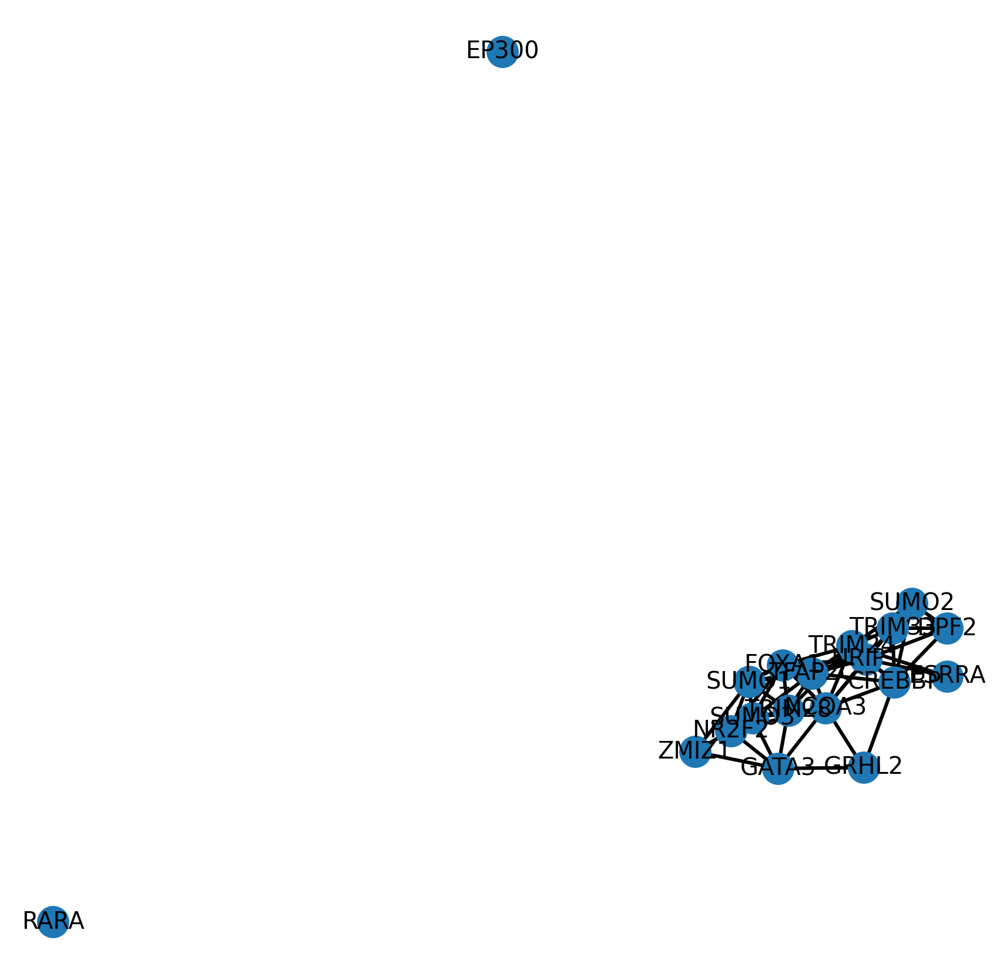

In [9]:
def mat_to_net(df):
    G = nx.Graph()
    posi = []
    neg = []
    for x in np.argwhere(abs(np.triu(df.values)) > 0.5):
        G.add_edge(genes[x[0]], genes[x[1]], weight=1/abs(df.loc[genes[x[0]], genes[x[1]]]))
        if df.loc[genes[x[0]], genes[x[1]]] > 0.5:
            posi.append((genes[x[0]], genes[x[1]]))
        elif df.loc[genes[x[0]], genes[x[1]]] < -0.5:
            neg.append((genes[x[0]], genes[x[1]]))
    pos = nx.spring_layout(G)  # positions for all nodes

    plt.figure(figsize=(15, 15))
    # nodes
    nx.draw_networkx_nodes(G, pos, node_size=700)
    colors = range(21)
    # edges
    nx.draw_networkx_edges(G, pos, width=3)
#     nx.draw_networkx_edges(
#         G, pos, edgelist=neg, width=3, alpha=0.5, edge_color="b", style="dashed"
#     )

    # labels
    nx.draw_networkx_labels(G, pos, font_size=20, font_family="sans-serif")

    plt.axis("off")
    return plt.show()
mat_to_net(corr["CTRL"])

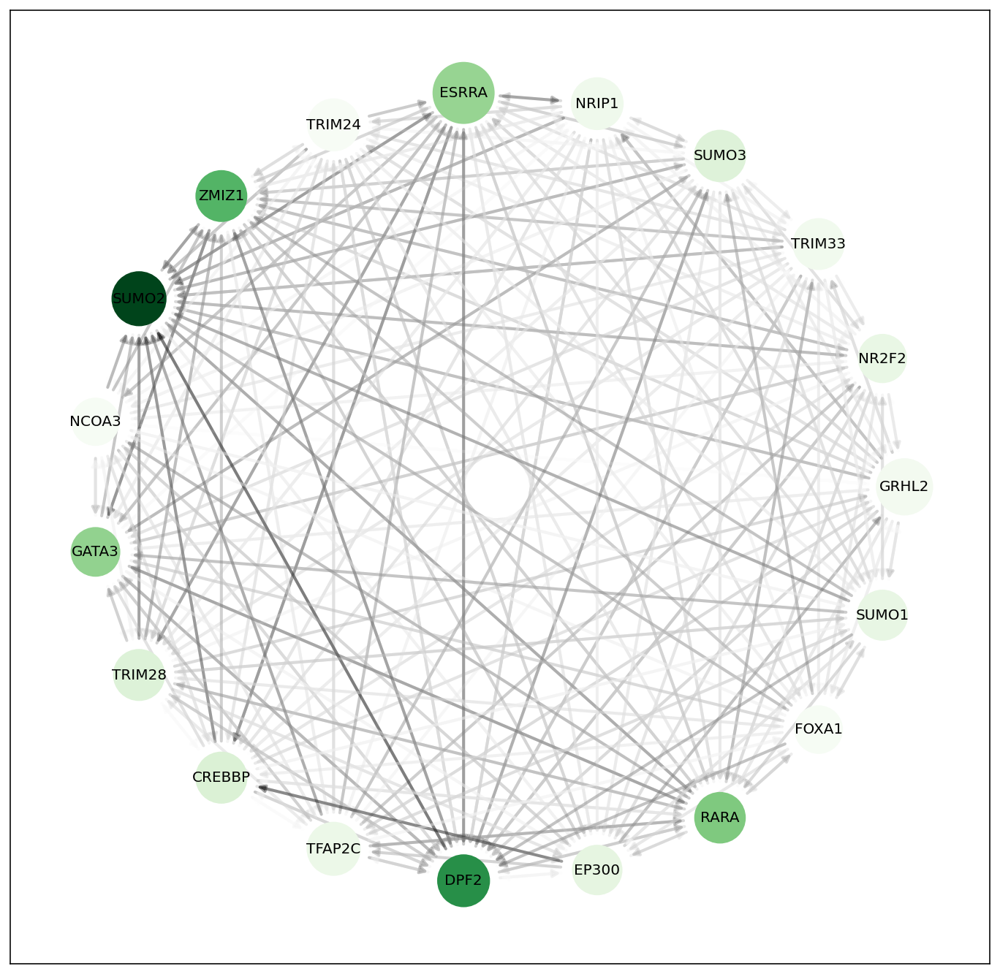

In [10]:
genes = ['GRHL2', 'NR2F2', 'TRIM33', 'SUMO3', 'NRIP1', 'ESRRA', 'TRIM24',
       'ZMIZ1', 'SUMO2', 'NCOA3', 'GATA3', 'TRIM28', 'CREBBP', 'TFAP2C',
       'DPF2', 'EP300', 'RARA', 'FOXA1', 'SUMO1']
d = pd.concat([(corr[g] - corr['CTRL'])[g] for g in genes], axis=1)
d = abs(d).reindex(index=genes)
cut = 0
d[d<cut] = 0
G = nx.DiGraph()
G.add_nodes_from(np.arange(0, len(d.columns), 1))
labels = {}
node_colors = []
colors = []
sizes = []
for idx, node in enumerate(G.nodes()):
    labels[node] = d.columns.values[idx]
for i in range(0, len(d.columns)):
    sizes.append(300 * np.sum(d.iloc[i, :]))
    node_colors.append(np.sum(d.iloc[:, i]))
    for j in range(0, len(d.columns)):
        if i != j and d.iloc[i, j] != 0:
            G.add_edge(i, j)
            colors.append(d.iloc[i, j])
colors = (np.array(colors) - cut) / (max(colors) - cut)
plt.figure(figsize=(12, 12))
pos = nx.circular_layout(G)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.Greens, node_size=sizes, alpha=1.0)
nx.draw_networkx_edges(G, pos, edge_color=colors, edge_cmap=plt.cm.binary, edge_vmin=0.0, width=2.0, arrowstyle='-|>', alpha=0.4, min_source_margin=25, min_target_margin=25)
nx.draw_networkx_labels(G, pos, labels, font_size=10)
plt.show()

In [11]:
corr["SUMO1"]


,CREBBP,DPF2,EP300,ESRRA,FOXA1,GATA3,GRHL2,NCOA3,NR2F2,NRIP1,RARA,SUMO1,SUMO2,SUMO3,TFAP2C,TRIM24,TRIM28,TRIM33,ZMIZ1
CREBBP,1.000000,-0.303030,0.515152,-0.363636,0.454545,0.575758,0.636364,0.424242,0.272727,0.393939,0.000000,0.424242,-0.484848,0.333333,0.696970,0.575758,0.636364,0.333333,-0.333333
DPF2,-0.303030,1.000000,-0.303030,0.575758,-0.303030,-0.181818,-0.363636,-0.515152,-0.424242,-0.424242,0.454545,-0.393939,-0.030303,-0.242424,-0.363636,-0.242424,-0.181818,-0.484848,0.363636
EP300,0.515152,-0.303030,1.000000,-0.303030,0.515152,0.575758,0.151515,0.363636,0.212121,0.272727,-0.303030,0.363636,-0.242424,0.515152,0.515152,0.333333,0.575758,0.272727,-0.151515
ESRRA,-0.363636,0.575758,-0.303030,1.000000,-0.121212,-0.121212,-0.424242,-0.636364,-0.484848,-0.545455,0.333333,-0.454545,-0.030303,-0.484848,-0.242424,-0.363636,-0.181818,-0.424242,0.484848
FOXA1,0.454545,-0.303030,0.515152,-0.121212,1.000000,0.818182,0.333333,0.363636,0.575758,0.393939,-0.121212,0.424242,-0.242424,0.636364,0.696970,0.515152,0.757576,0.515152,-0.393939
GATA3,0.575758,-0.181818,0.575758,-0.121212,0.818182,1.000000,0.393939,0.242424,0.393939,0.272727,0.000000,0.363636,-0.363636,0.575758,0.818182,0.696970,0.939394,0.333333,-0.333333
GRHL2,0.636364,-0.363636,0.151515,-0.424242,0.333333,0.393939,1.000000,0.545455,0.575758,0.636364,-0.060606,0.606061,-0.242424,0.272727,0.515152,0.636364,0.393939,0.515152,-0.636364
NCOA3,0.424242,-0.515152,0.363636,-0.636364,0.363636,0.242424,0.545455,1.000000,0.787879,0.727273,-0.333333,0.575758,0.030303,0.606061,0.303030,0.363636,0.303030,0.727273,-0.727273
NR2F2,0.272727,-0.424242,0.212121,-0.484848,0.575758,0.393939,0.575758,0.787879,1.000000,0.818182,-0.303030,0.666667,0.121212,0.636364,0.333333,0.454545,0.393939,0.818182,-0.818182
NRIP1,0.393939,-0.424242,0.272727,-0.545455,0.393939,0.272727,0.636364,0.727273,0.818182,1.000000,-0.424242,0.666667,0.060606,0.515152,0.151515,0.393939,0.272727,0.818182,-0.818182


In [12]:
genes = ['GRHL2', 'NR2F2', 'TRIM33', 'SUMO3', 'NRIP1', 'ESRRA', 'TRIM24',
       'ZMIZ1', 'SUMO2', 'NCOA3', 'GATA3', 'TRIM28', 'CREBBP', 'TFAP2C',
       'DPF2', 'EP300', 'RARA', 'FOXA1', 'SUMO1']


In [13]:
cut = 0.5

In [14]:
# d = pd.concat([(corr[g] - corr['CTRL'])[((abs(corr[g]) > cut) & (abs(corr['CTRL']) > cut))].loc[g:g] for g in genes], axis=0).reindex(genes, axis=1)

rows = []
for g in genes:
    selection = (abs(corr[g]) > cut) & (abs(corr['CTRL']) > cut)
    rows.append((corr[g] - corr['CTRL'])[selection].loc[g:g])
d = pd.concat(rows).reindex(genes, axis=1)

In [15]:
d

,GRHL2,NR2F2,TRIM33,SUMO3,NRIP1,ESRRA,TRIM24,ZMIZ1,SUMO2,NCOA3,GATA3,TRIM28,CREBBP,TFAP2C,DPF2,EP300,RARA,FOXA1,SUMO1
GRHL2,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,-0.016607,-0.027435,NaN,0.189551,NaN,NaN,NaN,NaN,NaN,NaN
NR2F2,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.074821,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TRIM33,NaN,NaN,0.000000,NaN,-0.079348,NaN,-0.140973,NaN,-0.133435,0.142297,NaN,NaN,0.005195,NaN,-0.086376,NaN,NaN,NaN,NaN
SUMO3,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,0.007867,NaN,-0.043819,NaN,NaN,NaN,NaN,NaN,NaN,-0.152953
NRIP1,NaN,NaN,0.018159,NaN,0.000000,NaN,-0.133604,NaN,-0.086313,0.059731,NaN,NaN,0.069120,-0.067034,-0.004636,NaN,NaN,NaN,NaN
ESRRA,NaN,NaN,NaN,NaN,NaN,0.00000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
TRIM24,NaN,NaN,-0.139987,NaN,-0.273303,0.00724,0.000000,NaN,0.026218,-0.059935,NaN,NaN,-0.111390,-0.155604,NaN,NaN,NaN,NaN,NaN
ZMIZ1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SUMO2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NCOA3,-0.013445,0.076603,0.048563,NaN,-0.034763,NaN,-0.064308,NaN,NaN,0.000000,-0.053516,NaN,0.113490,0.125697,NaN,NaN,NaN,NaN,NaN


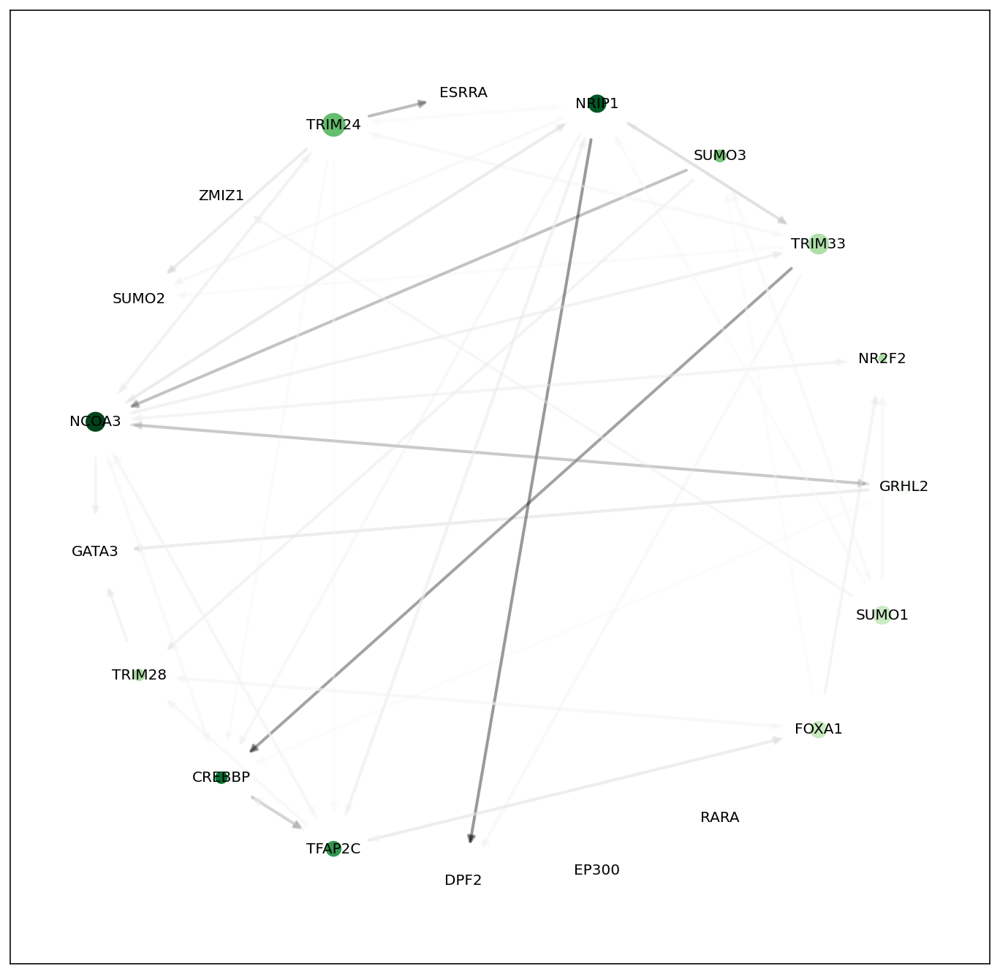

In [16]:
absd = abs(d)
G = nx.DiGraph()
G.add_nodes_from(np.arange(0, len(absd.columns), 1))
labels = {}
node_colors = []
colors = []
sizes = []
for idx, node in enumerate(G.nodes()):
    labels[node] = absd.columns.values[idx]
for i in range(0, len(absd.columns)):
    sizes.append(300 * np.sum(absd.iloc[i, :]))
    node_colors.append(np.sum(absd.iloc[:, i]))
    for j in range(0, len(absd.columns)):
        if i != j and not np.isnan(absd.iloc[i, j]):
            G.add_edge(i, j)
            colors.append(1/absd.iloc[i, j])
plt.figure(figsize=(12, 12))
pos = nx.circular_layout(G)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.Greens, node_size=sizes, alpha=1.0)
nx.draw_networkx_edges(G, pos, edge_color=colors, edge_cmap=plt.cm.binary, edge_vmin=0.0, width=2.0, arrowstyle='-|>', alpha=0.4, min_source_margin=25, min_target_margin=25)
nx.draw_networkx_labels(G, pos, labels, font_size=10)
plt.savefig("kendalll_correlation_mono.png")
plt.show()

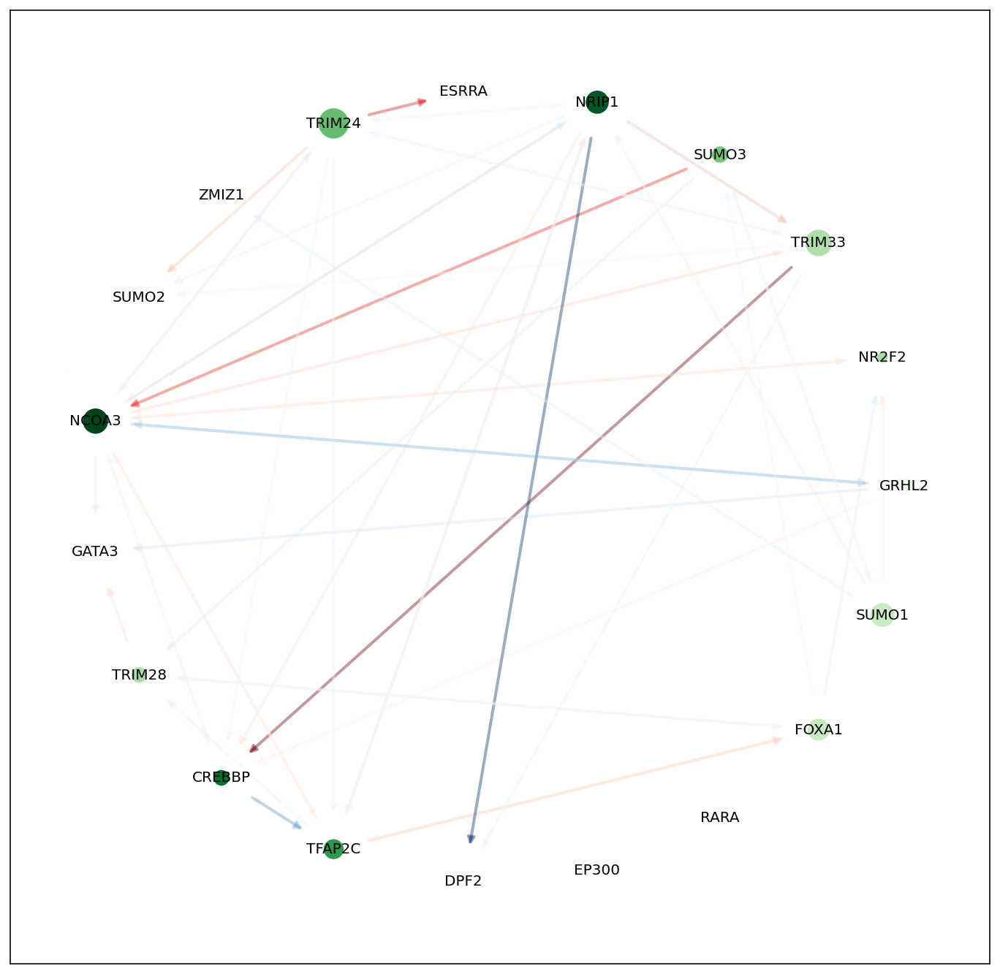

In [17]:
G = nx.DiGraph()
G.add_nodes_from(np.arange(0, len(d.columns), 1))
labels = {}
node_colors = []
pcolors = []
ncolors = []
sizes = []
positive = []
negative = []
for idx, node in enumerate(G.nodes()):
    labels[node] = d.columns.values[idx]
for i in range(0, len(d.columns)):
    sizes.append(500 * np.sum(abs(d.iloc[i, :])))
    node_colors.append(np.sum(abs(d.iloc[:, i])))
    for j in range(0, len(d.columns)):
        if i != j:
            if d.iloc[i, j] > 0:
                G.add_edge(i, j)
                pcolors.append(1/d.iloc[i, j])
                positive.append((i, j))
            elif d.iloc[i, j] < 0:
                G.add_edge(i, j)
                ncolors.append(1/abs(d.iloc[i, j]))
                negative.append((i, j))
plt.figure(figsize=(12, 12))
pos = nx.circular_layout(G)
nx.draw_networkx_nodes(G, pos, node_color=node_colors, cmap=plt.cm.Greens, node_size=sizes, alpha=1.0)
nx.draw_networkx_edges(G, pos, edge_color=pcolors, edgelist= positive, edge_cmap=plt.cm.Reds, edge_vmin=0.0, width=2.0, arrowstyle='-|>', alpha=0.4, min_source_margin=25, min_target_margin=25)
nx.draw_networkx_edges(G, pos, edge_color=ncolors, edgelist= negative, edge_cmap=plt.cm.Blues, edge_vmin=0.0, width=2.0, arrowstyle='-|>', alpha=0.4, min_source_margin=25, min_target_margin=25)
# nx.draw_networkx_edges(G, pos, edge_color="y", edgelist= largest, edge_vmin=0.0, width=2.0, arrowstyle='-|>', alpha=0.4, min_source_margin=25, min_target_margin=25)
nx.draw_networkx_labels(G, pos, labels, font_size=10)
plt.savefig("kendall_correlation_coloured.png")
plt.show()